# Data Visualization 
## by Kashish Gupta (Masters in Quantitative Economics, UCLA)

### This database contains information on cost of living in world's 5000 cities 
#### Data source: Numbeo's website

In [58]:
# import relevant packages 

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from fitter import Fitter

In [59]:
# importing database

cost = pd.read_csv("cost-of-living_v2.csv")
cost.head()

,city,country,meal (mid),meal(McD),Beer,Cappuccino,Coke/Pepsi,Water,Milk,Bread,Apples,Potato,Cigarettes,Gasoline,Utility,Internet,Fitness Club,Primary School,Avg Salary,Interest Rate
0,Seoul,South Korea,53.78,6.15,3.07,3.93,1.48,0.79,2.20,2.85,6.77,3.84,3.46,1.43,182.13,22.48,55.88,17902.55,2689.62,3.47
1,Shanghai,China,39.86,5.69,1.14,3.98,0.53,0.33,2.74,2.61,2.26,0.84,3.56,1.20,66.00,17.07,63.49,26379.45,1419.87,5.03
2,Guangzhou,China,28.47,4.98,0.85,3.54,0.44,0.33,1.91,1.63,2.02,0.74,3.70,1.19,59.65,16.66,34.17,24556.21,1211.68,5.19
3,Mumbai,India,18.42,3.68,2.46,2.48,0.48,0.19,0.75,0.50,2.09,0.44,4.30,1.35,43.57,9.33,25.37,3682.67,640.81,7.96
4,Delhi,India,22.11,4.30,1.84,1.77,0.49,0.19,0.73,0.50,1.79,0.37,4.30,1.24,58.07,7.95,21.20,1964.24,586.46,8.06


In [9]:
# description of variables and nulls 

print (cost.info())
print (cost.describe())

## there exists null values 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4956 entries, 0 to 4955
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   city            4956 non-null   object 
 1   country         4956 non-null   object 
 2   meal (mid)      4505 non-null   float64
 3   meal(McD)       4622 non-null   float64
 4   Beer            4460 non-null   float64
 5   Cappuccino      4612 non-null   float64
 6   Coke/Pepsi      4511 non-null   float64
 7   Water           4640 non-null   float64
 8   Milk            4578 non-null   float64
 9   Bread           4543 non-null   float64
 10  Apples          4584 non-null   float64
 11  Potato          4519 non-null   float64
 12  Cigarettes      4466 non-null   float64
 13  Gasoline        4368 non-null   float64
 14  Utility         4468 non-null   float64
 15  Internet        4607 non-null   float64
 16  Fitness Club    3581 non-null   float64
 17  Primary School  3275 non-null   f

In [29]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


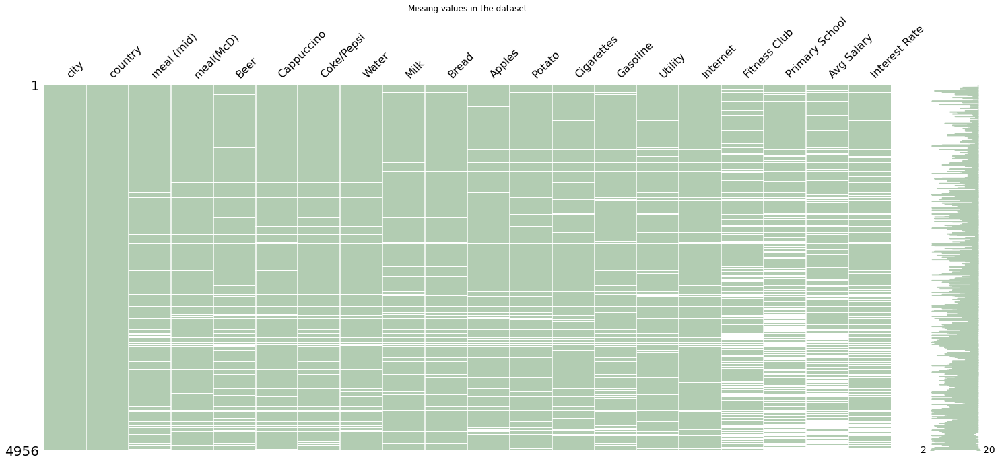

In [31]:
# visualize null values 

import missingno as msno
msno.matrix(cost.iloc[:,:],color = (0.7, 0.8, 0.7))
plt.title("Missing values in the dataset")
plt.show()

# the white lines show the presence of missing observations 

In [60]:
# treating null values 

for i in cost.columns[2:]:        # filling nulls with column average 
    mean_value=cost[i].mean()
    cost[i].fillna(value=mean_value, inplace=True)
    
cost.isnull().sum()               # checking count of null values, now we have 0 nulls 

city              0
country           0
meal (mid)        0
meal(McD)         0
Beer              0
Cappuccino        0
Coke/Pepsi        0
Water             0
Milk              0
Bread             0
Apples            0
Potato            0
Cigarettes        0
Gasoline          0
Utility           0
Internet          0
Fitness Club      0
Primary School    0
Avg Salary        0
Interest Rate     0
dtype: int64

In [61]:
# group the data by countries 

cost_new = cost.groupby(['country']).mean().reset_index()           # take the average of all cities 
cost_new

,country,meal (mid),meal(McD),Beer,Cappuccino,Coke/Pepsi,Water,Milk,Bread,Apples,Potato,Cigarettes,Gasoline,Utility,Internet,Fitness Club,Primary School,Avg Salary,Interest Rate
0,Afghanistan,19.032604,4.294899,3.193145,1.316651,0.726291,0.466601,0.618092,0.699285,1.003232,0.544413,3.008418,0.888611,105.584722,262.207790,24.199997,4803.511291,1006.324819,8.855682
1,Albania,25.532000,4.223333,1.378667,1.198667,1.148667,0.604000,1.136667,0.592000,0.943333,0.646667,2.871333,1.752000,81.174667,24.855558,29.594665,3891.294244,659.225261,5.208273
2,Algeria,15.711636,3.071159,1.880829,0.771759,0.519526,0.225877,0.687310,0.313193,2.149100,0.554308,2.354427,0.331225,50.590833,47.055297,16.579411,5378.305016,491.864457,6.453899
3,American Samoa,6.660000,22.130000,1.910000,1.000000,1.190000,2.110000,1.050000,3.160000,2.110000,1.566477,6.285253,1.361664,136.254584,81.140000,36.849994,8770.865915,1821.186305,6.518030
4,Andorra,40.920000,7.010000,2.073333,1.380000,1.713333,1.370000,0.950000,1.090000,2.546667,1.043333,5.883333,1.756667,75.010000,36.996667,54.266667,8727.480610,2842.183333,2.843333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210,Venezuela,34.529080,8.905539,1.549987,1.974720,1.132993,0.817211,1.508333,1.613651,4.022609,1.337550,3.993098,0.501111,24.088032,50.847965,32.749443,9005.529170,1097.610170,20.519125
211,Vietnam,23.366250,5.130851,1.407089,1.892372,0.677881,0.440915,1.319386,1.029320,2.542799,1.199497,1.866465,1.001587,81.229405,22.971749,29.445712,10447.815888,1033.757940,9.935245
212,Yemen,34.151116,10.554242,2.742760,2.601415,1.585392,0.725686,1.969587,1.173265,5.839913,2.042354,4.535787,2.056190,89.261310,85.210963,49.954282,4171.595976,1426.430218,10.150584
213,Zambia,29.079062,4.781299,1.788507,2.031415,1.022535,0.647087,1.219587,1.172244,2.622683,1.570422,3.568644,1.360713,138.789107,121.990015,34.988567,11794.022535,1617.722547,17.650584


# Univariate Analysis 

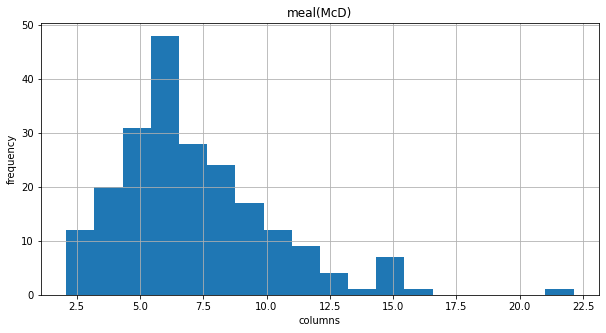

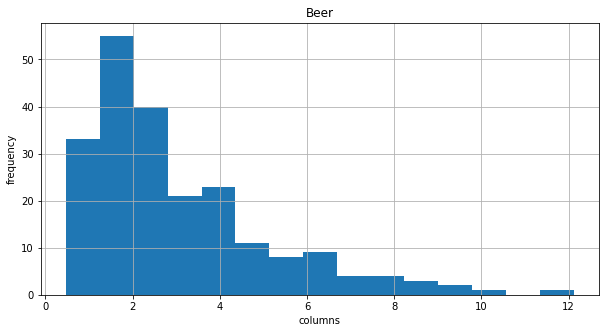

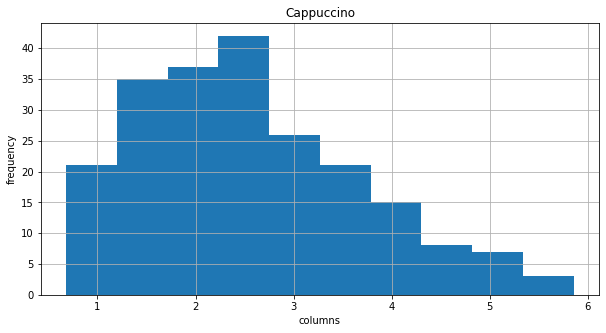

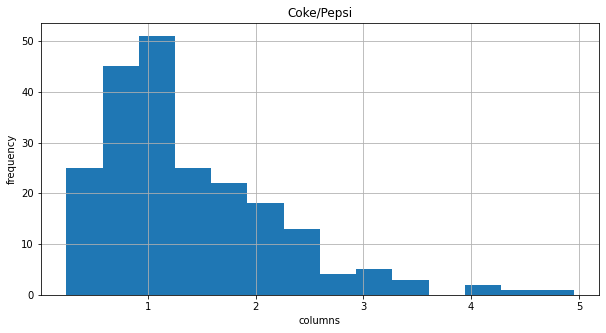

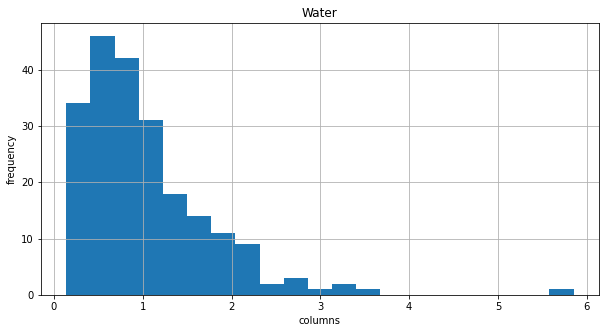

...

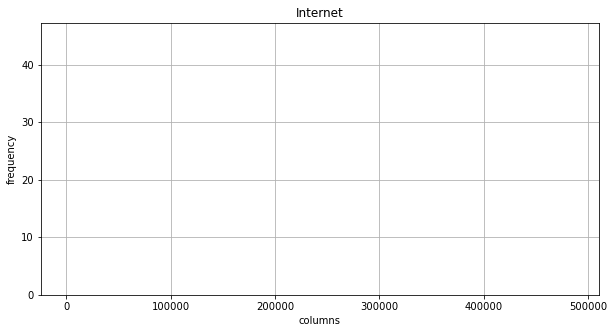

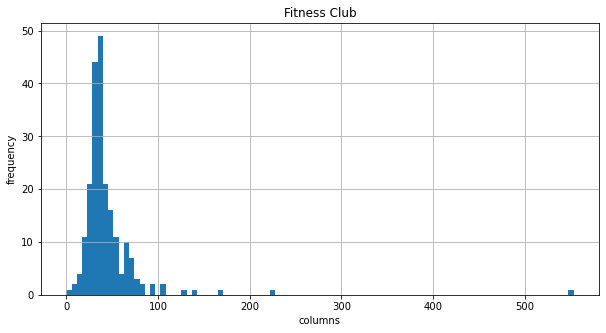

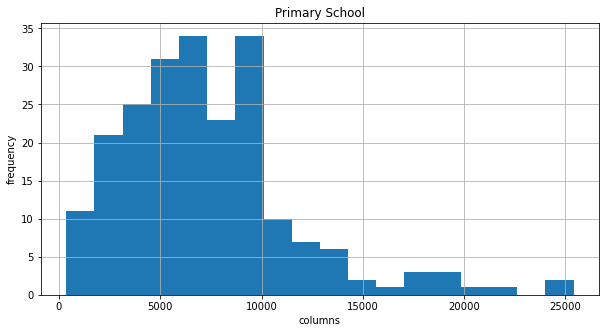

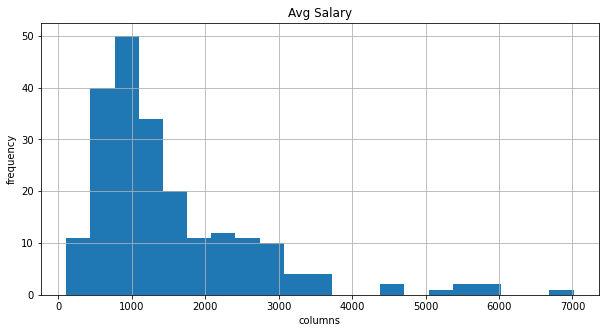

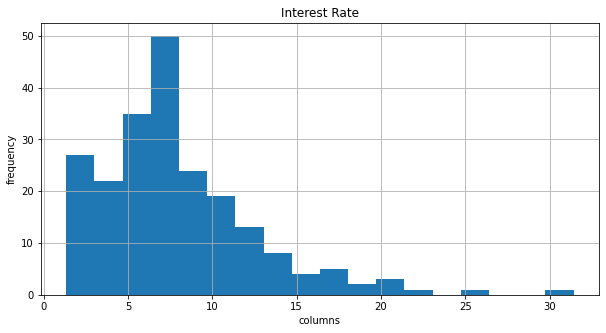

In [40]:
# histogram  

for i in cost_new.columns[2:]:
    plt.figure(figsize=(10,5))
    plt.hist(cost_new[i], bins = 'fd')
    plt.title(i)
    plt.xlabel("columns")
    plt.ylabel("frequency")
    plt.grid()
    plt.show()
    
# observation: skeweness is present in most of the variables, we need to transform the variables 

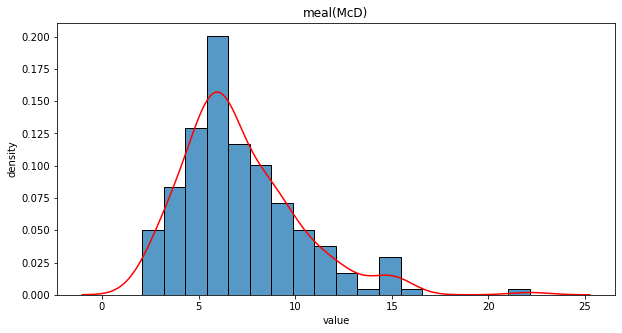

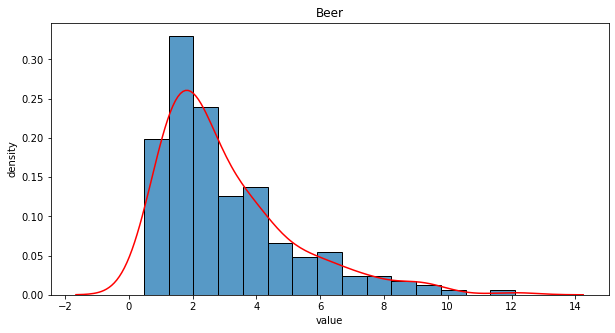

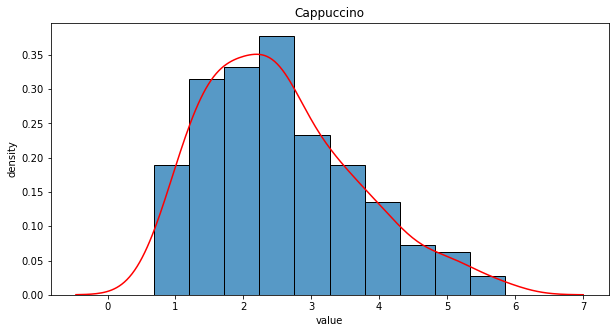

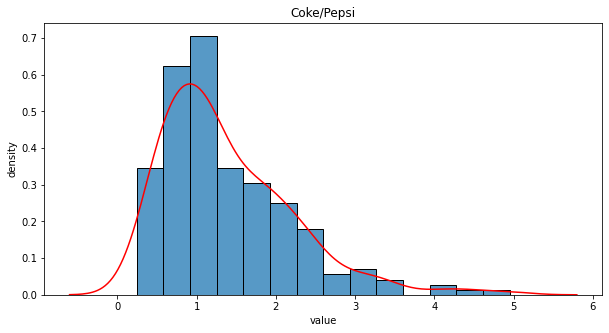

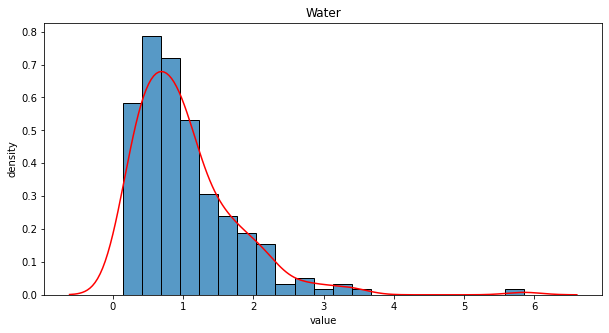

...

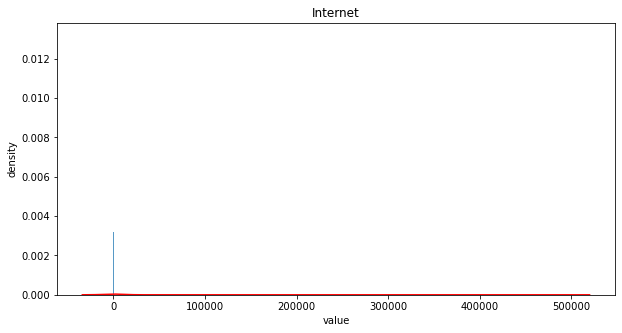

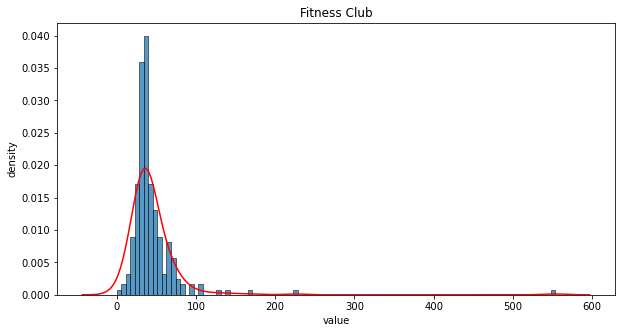

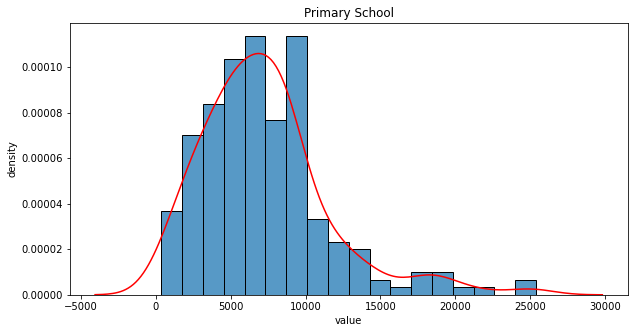

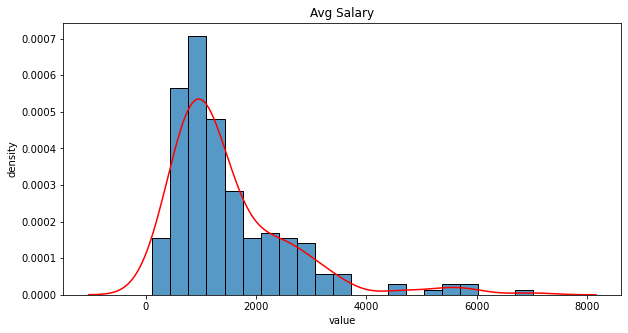

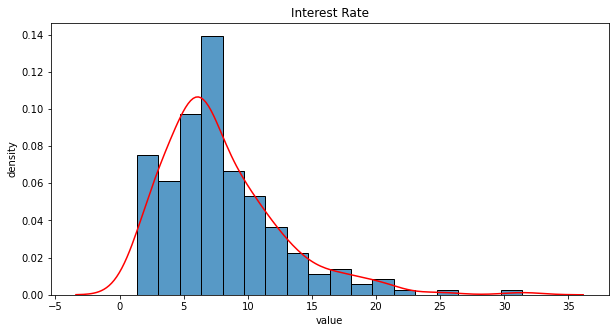

In [42]:
# kernel density plot 

for i in cost_new.columns[2:]:
    plt.figure(figsize = (10, 5))
    sns.histplot(cost_new[i], stat = "density")
    sns.kdeplot(cost_new[i], color = "red")
    plt.title(i)
    plt.xlabel("value")
    plt.ylabel("density")
    plt.show()
    
# observation: the variales need to be transformed, the current distribution is not normal distribution 

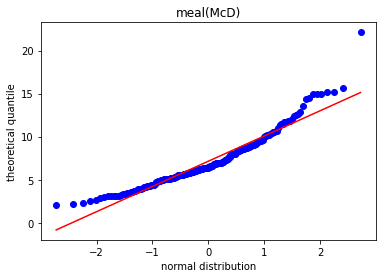

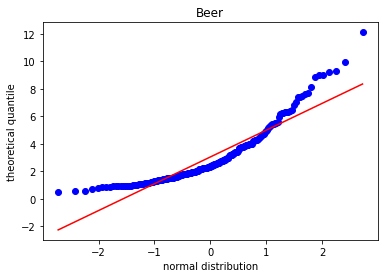

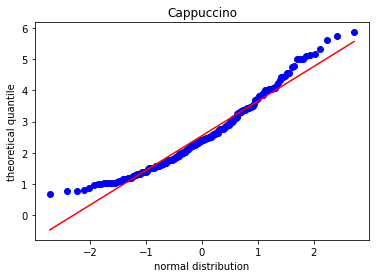

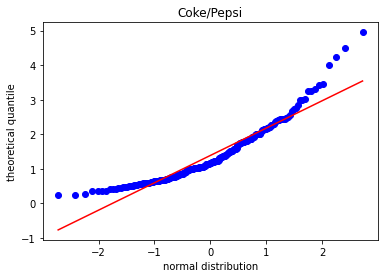

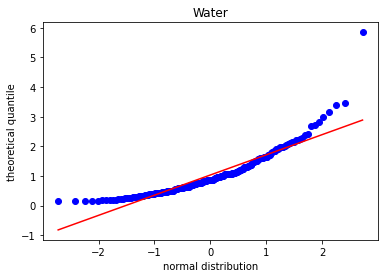

...

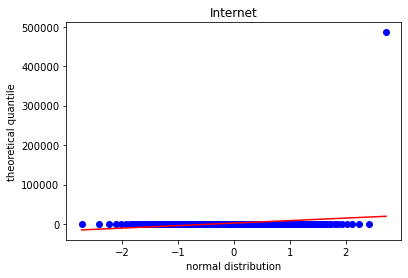

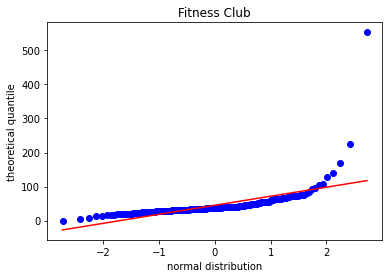

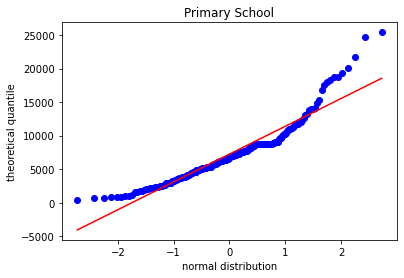

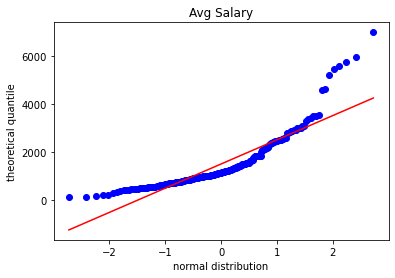

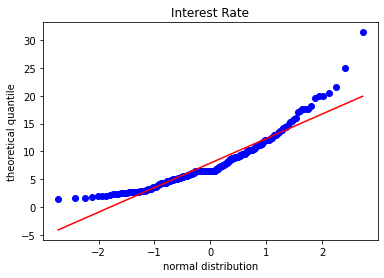

In [43]:
# quantile plot 

for i in cost_new.columns[2:]:
    stats.probplot(cost_new[i], dist="norm", plot=plt)
    plt.ylabel("theoretical quantile")
    plt.xlabel("normal distribution")
    plt.title(i)
    plt.show()
    
# observation: not really normally distributed, have to transform 

Fitting 106 distributions:  25%|███▋           | 26/106 [00:04<00:29,  2.69it/s]/Users/kashishgupta/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:3094: IntegrationWarning: The algorithm does not converge.  Roundoff error is detected
  in the extrapolation table.  It is assumed that the requested tolerance
  cannot be achieved, and that the returned result (if full_output = 1) is 
  the best which can be obtained.
  t1 = integrate.quad(llc, -np.inf, x)[0]
/Users/kashishgupta/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:3094: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  t1 = integrate.quad(llc, -np.inf, x)[0]
Fitting 106 distributions:  76%|███████████▍   | 81/106 [01:19<00:32,  1.31s/it]/Users/kashishgupta/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The algorithm does not converge.  Roundoff error is detected
  in the extrapolation 

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
foldnorm,9.370911e-11,inf,-114357.433293,inf,0.803021,0.0
rice,4.148944e-09,inf,-100503.471103,inf,0.519526,0.0
halfnorm,1.556435e-08,1.159379e+05,-95679.293705,inf,0.855191,0.0
genhalflogistic,1.603992e-08,7.567332e+04,-95561.082311,inf,0.765213,0.0
halflogistic,1.744668e-08,7.801785e+04,-95262.014925,inf,0.763626,0.0


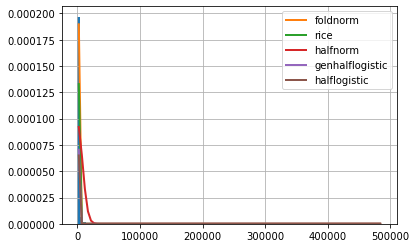

In [52]:
# Cullen Frey distribution: 

f = Fitter(cost_new.iloc[:,2:])       # to check the best fit distribution
f.fit()
f.summary()

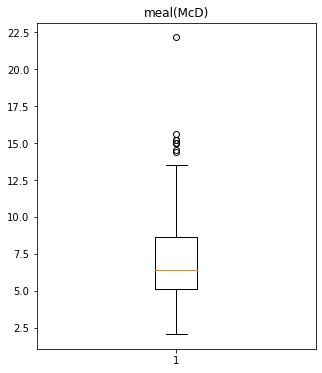

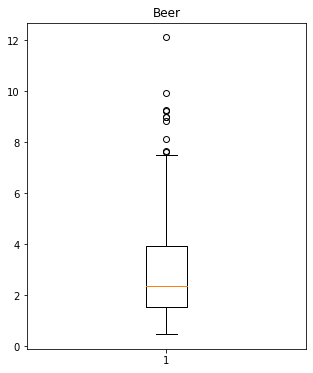

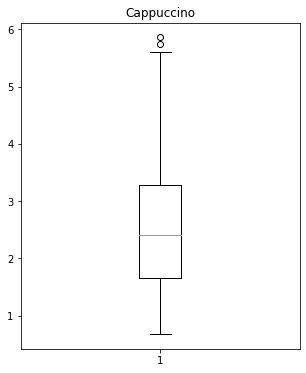

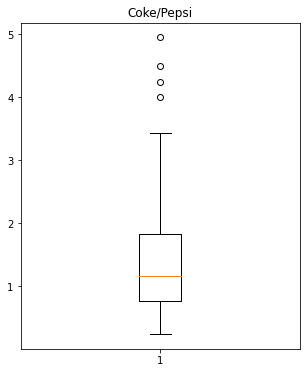

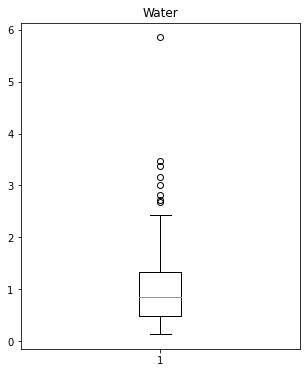

...

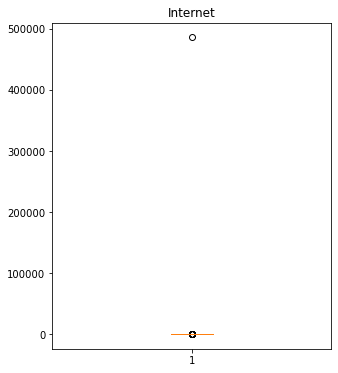

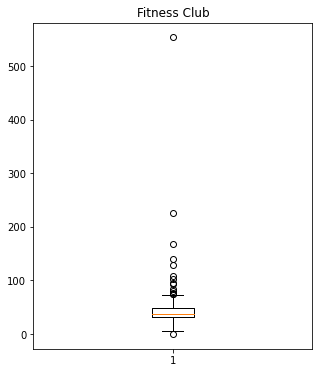

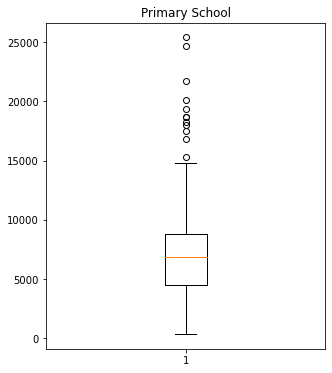

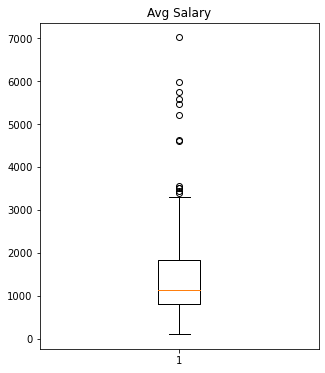

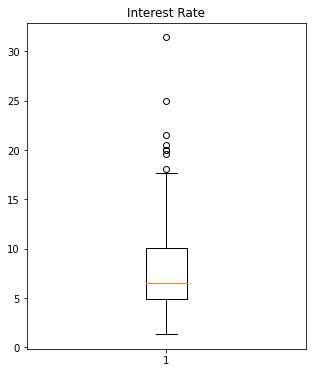

In [53]:
# boxplots 

for i in cost_new.columns[2:]:
    plt.figure(figsize=(5,6))
    plt.boxplot(cost_new[i])
    plt.title(i)
    plt.show()
    
# observation: outliers does exist and need to be dealt with 

# Bivariate Analysis 

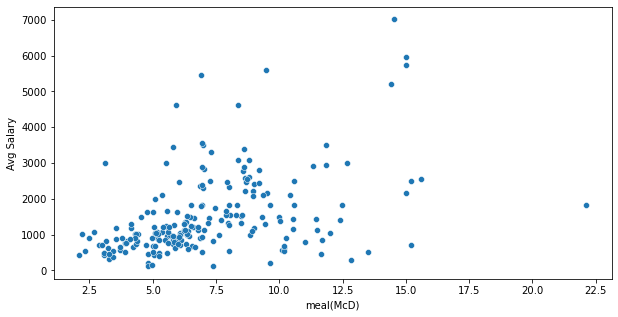

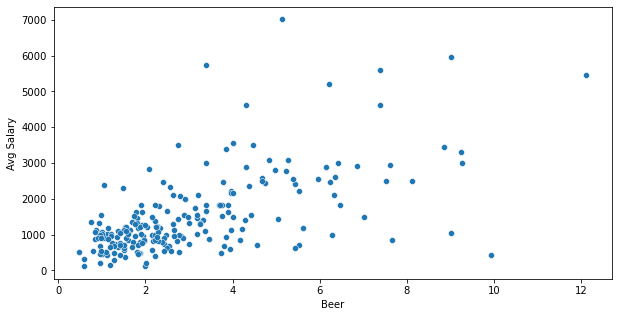

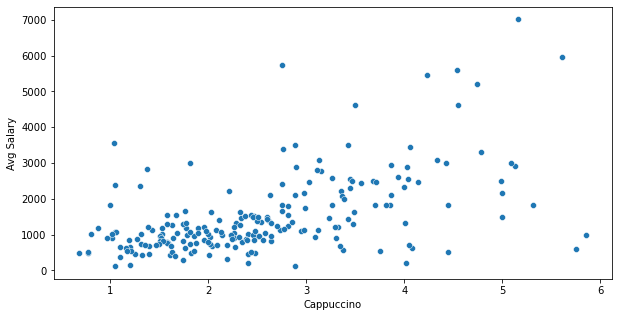

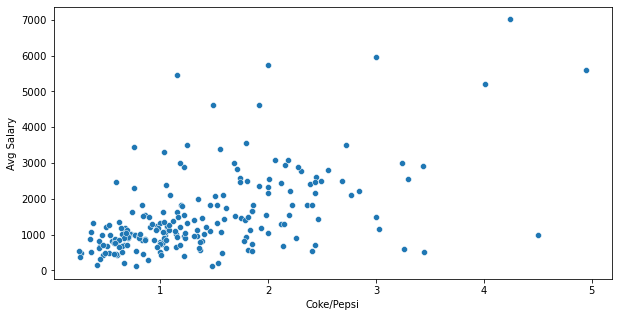

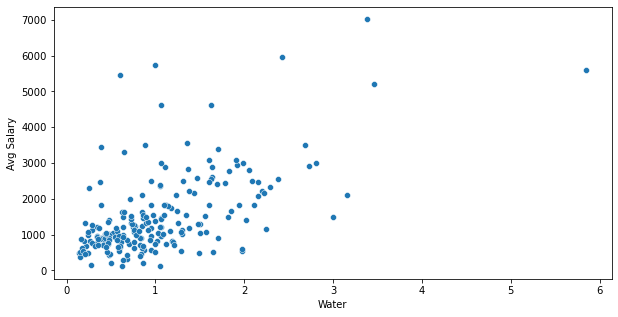

...

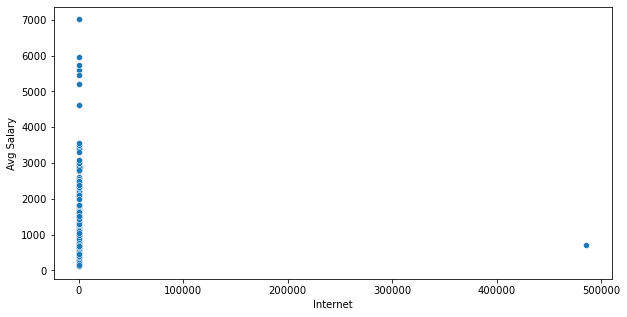

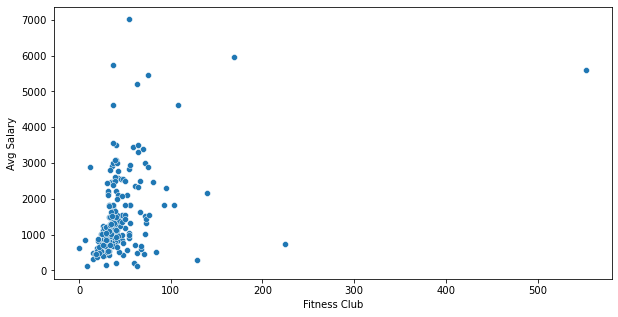

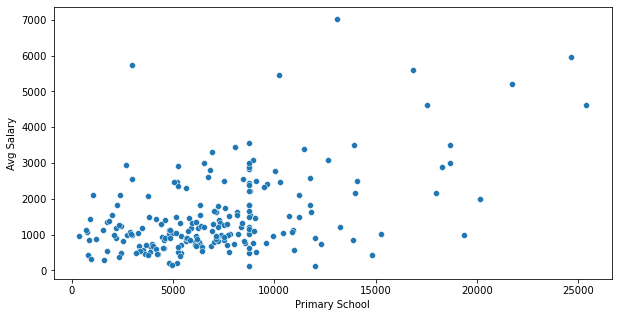

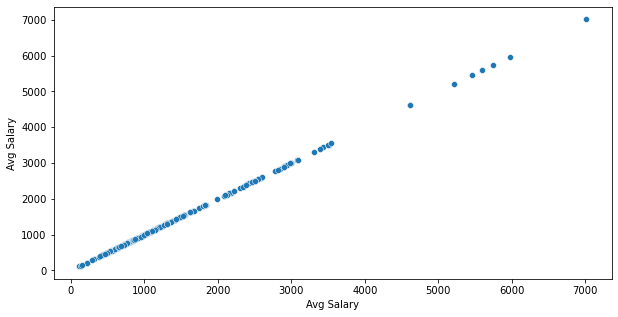

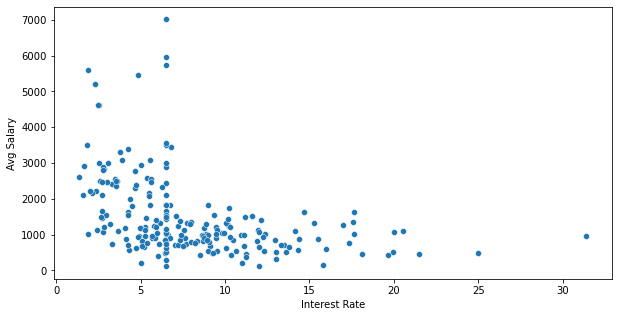

In [56]:
# scatterplot 

for i in cost_new.columns[2:]: 
    plt.figure(figsize = (10,5))
    sns.scatterplot(data = cost_new, x=cost_new[i], y="Avg Salary")
    plt.show()
    
# observation: there exists correlation among variables if the graph is a 45 degrees line, need to check for multicollinearity

<Figure size 1008x1008 with 0 Axes>

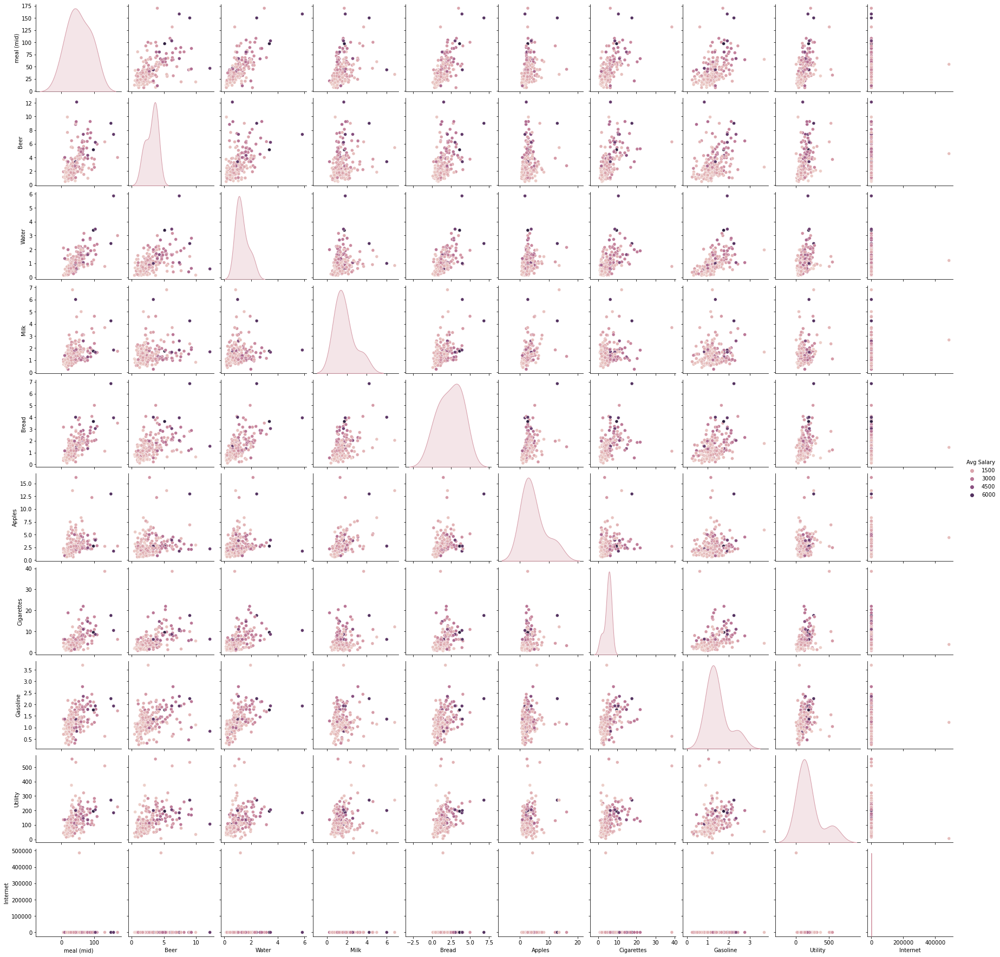

<Figure size 1008x1008 with 0 Axes>

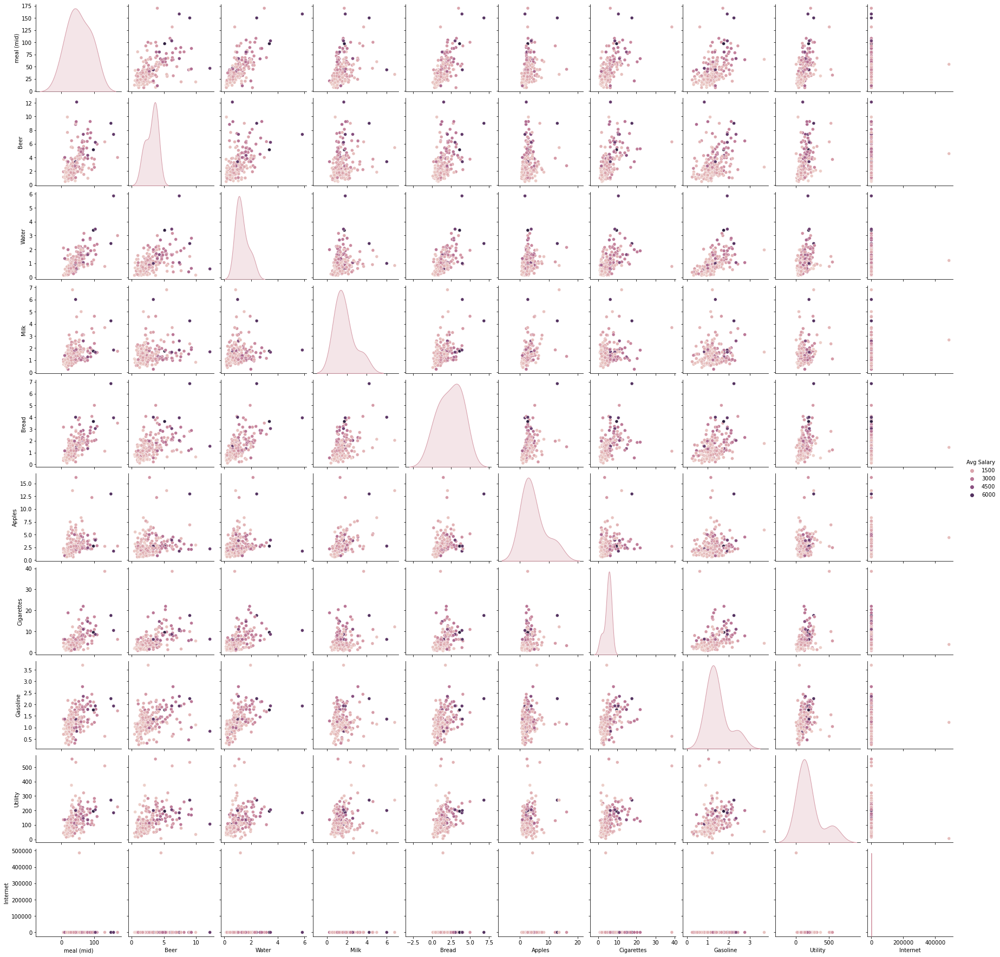

<Figure size 1008x1008 with 0 Axes>

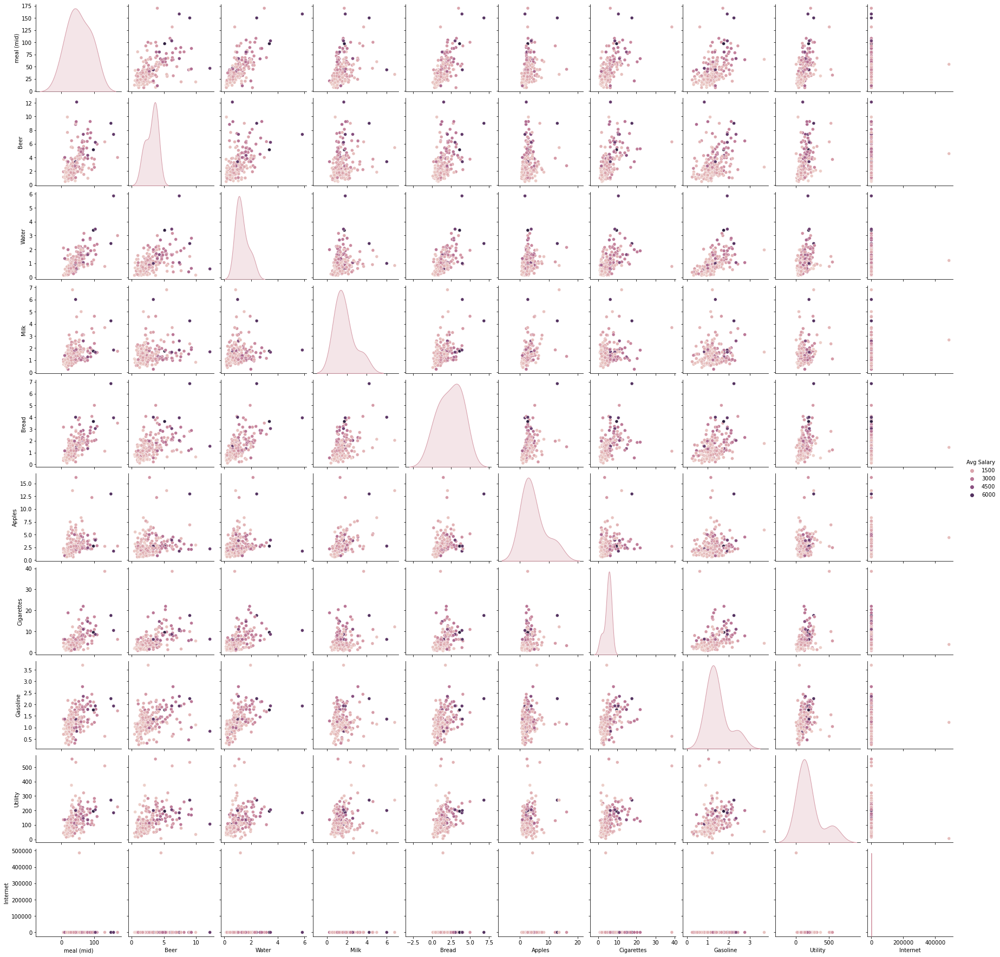

<Figure size 1008x1008 with 0 Axes>

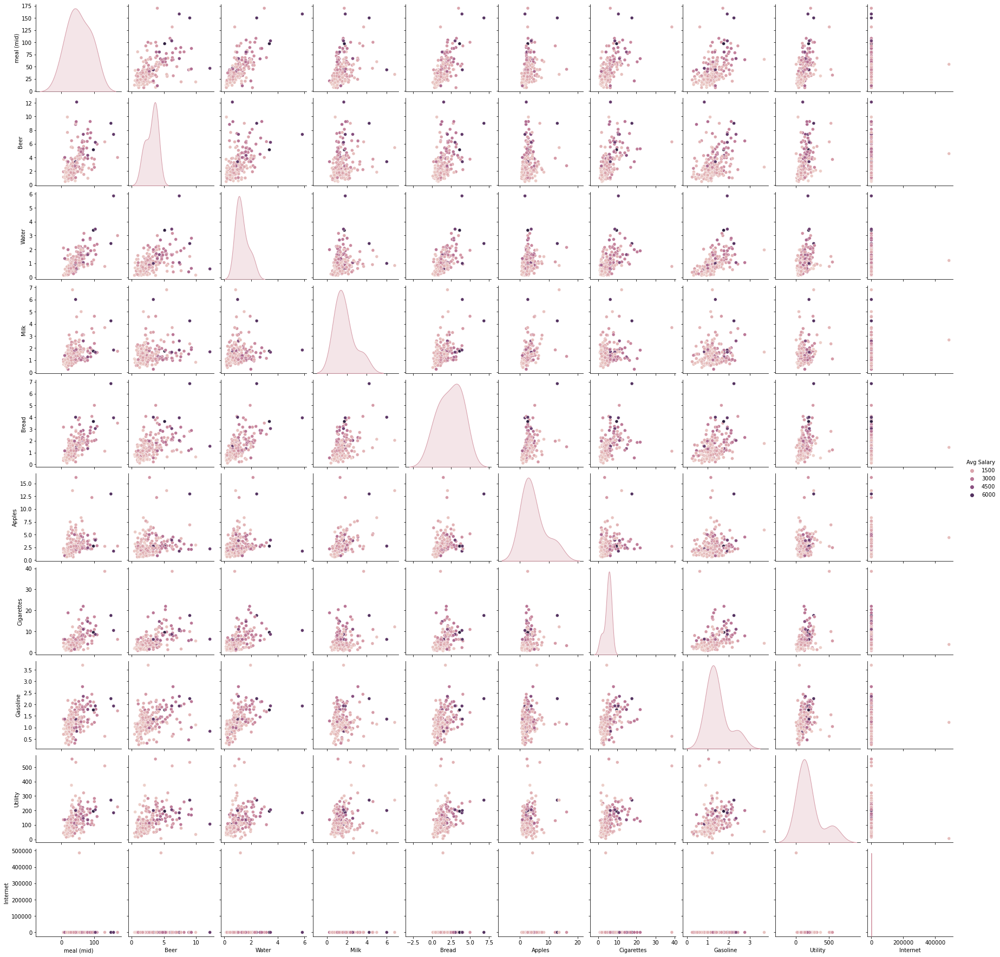

<Figure size 1008x1008 with 0 Axes>

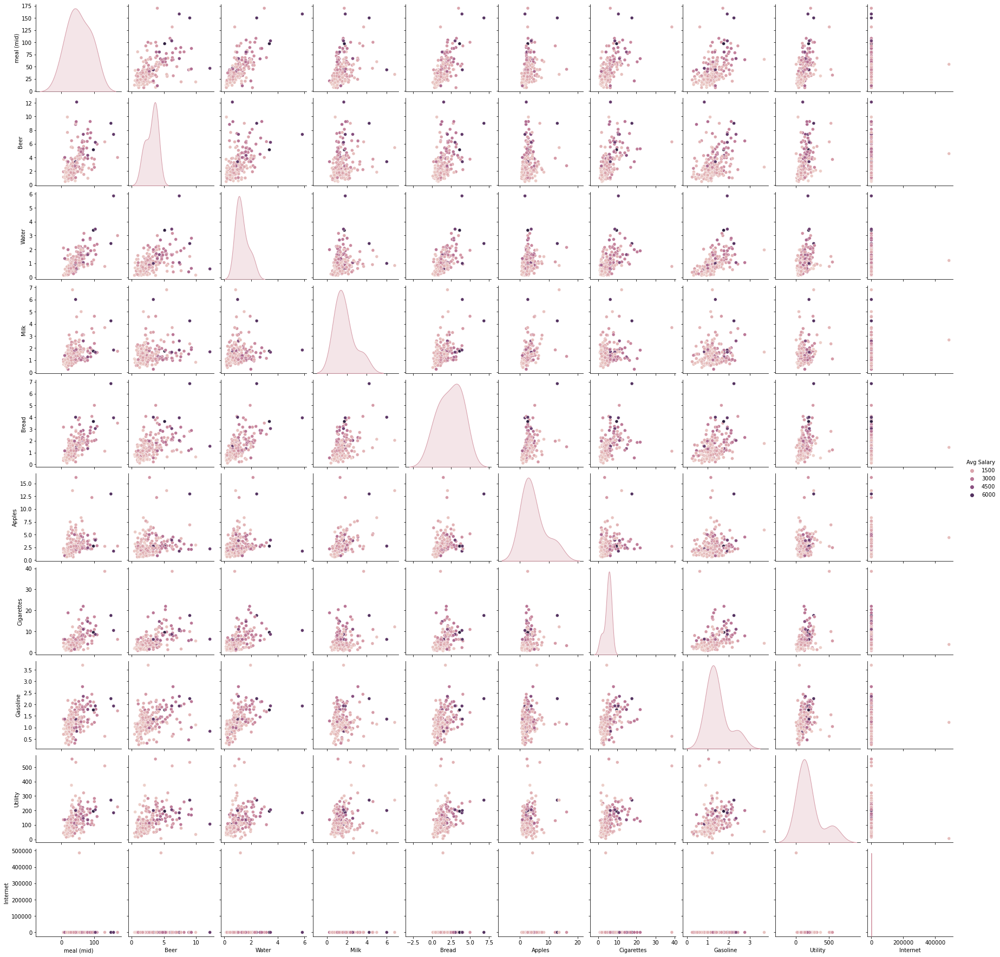

<Figure size 1008x1008 with 0 Axes>

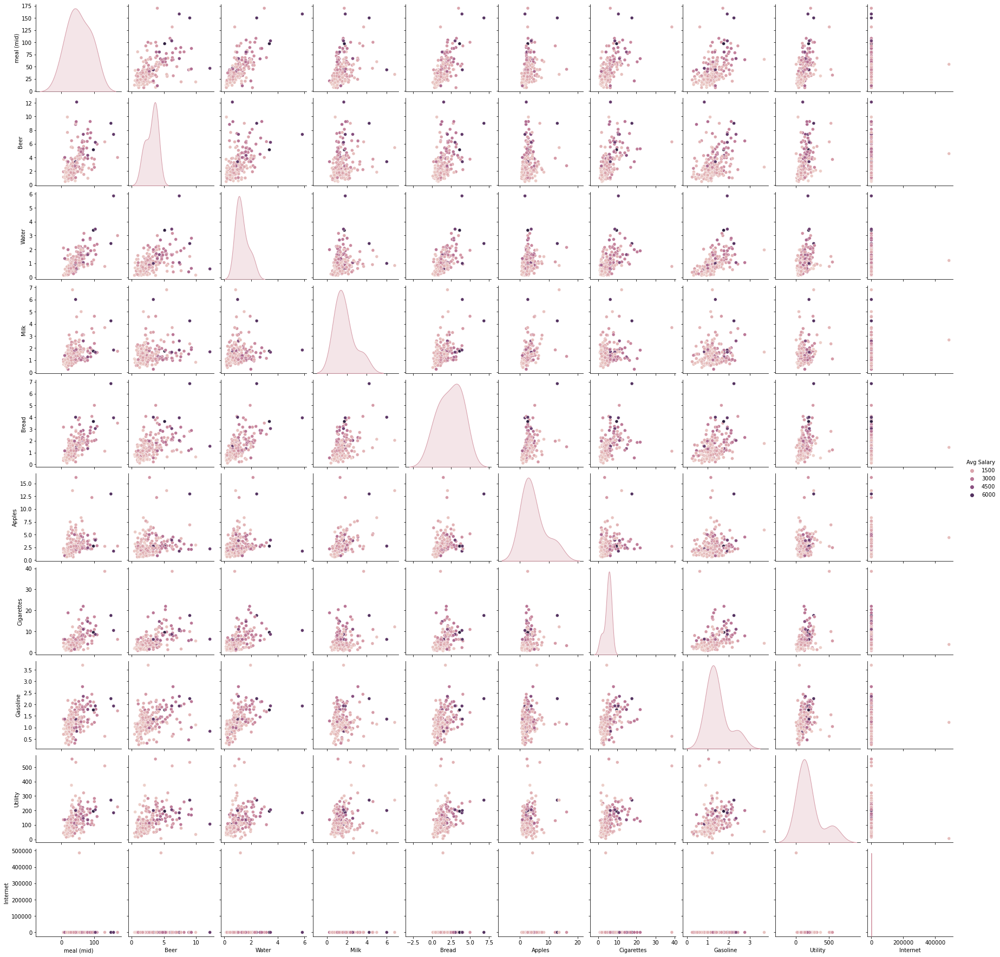

<Figure size 1008x1008 with 0 Axes>

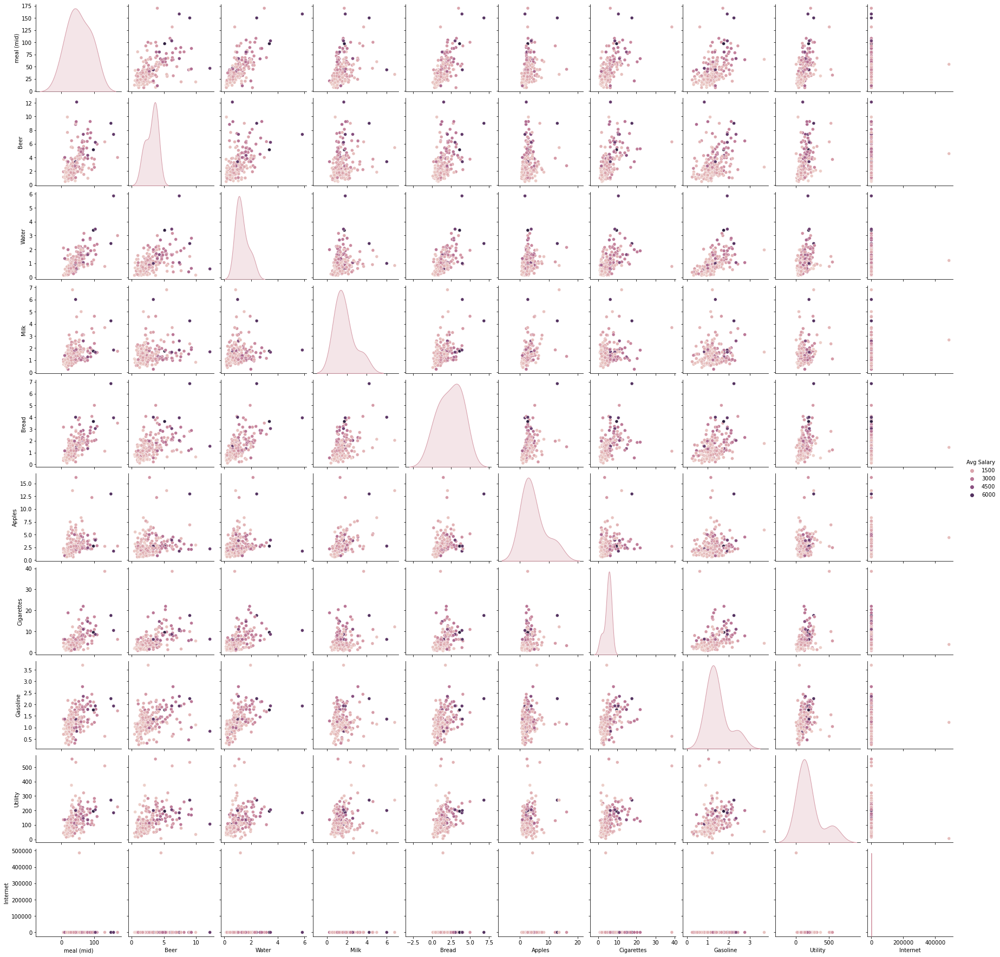

<Figure size 1008x1008 with 0 Axes>

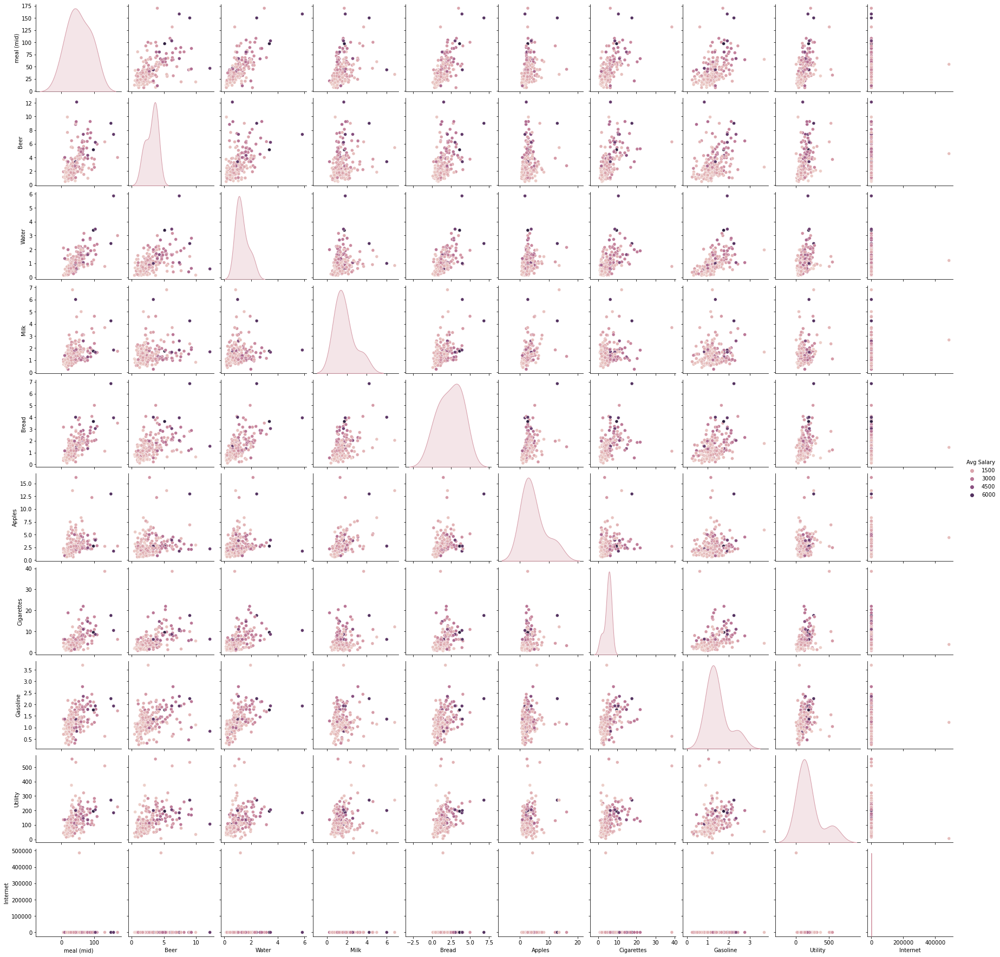

<Figure size 1008x1008 with 0 Axes>

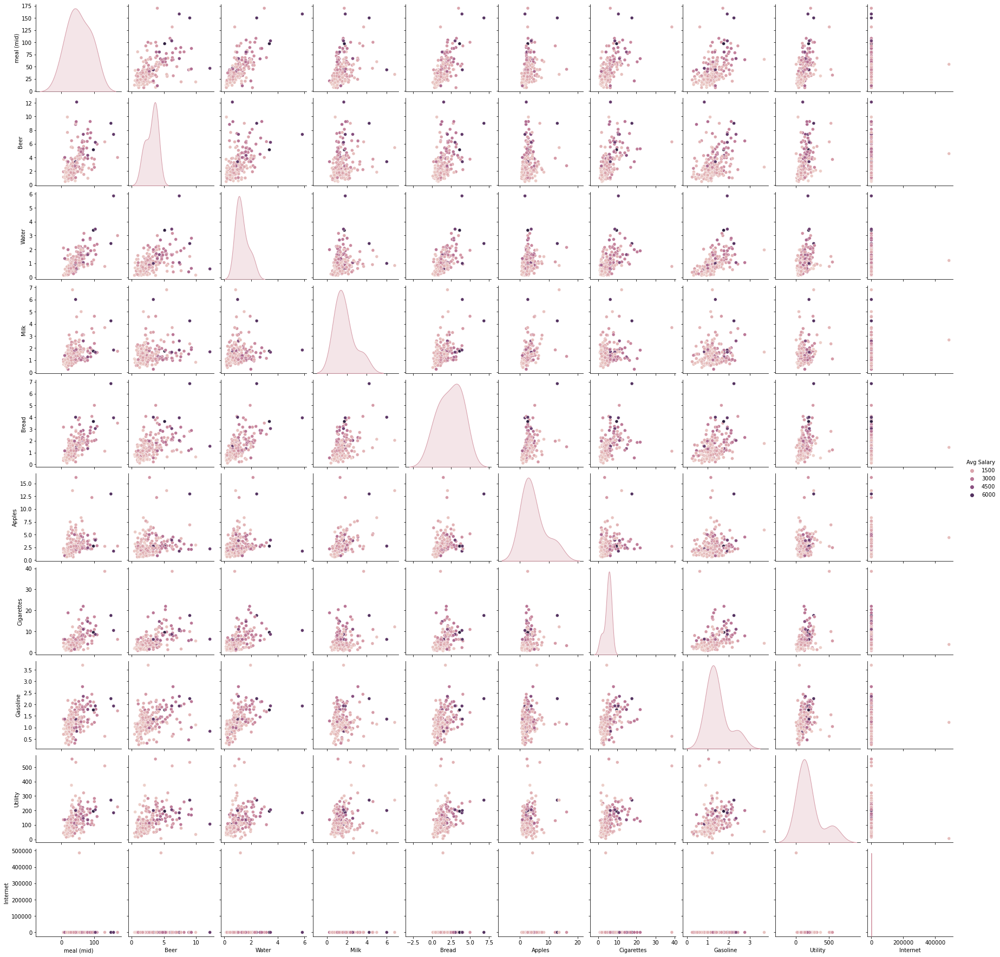

<Figure size 1008x1008 with 0 Axes>

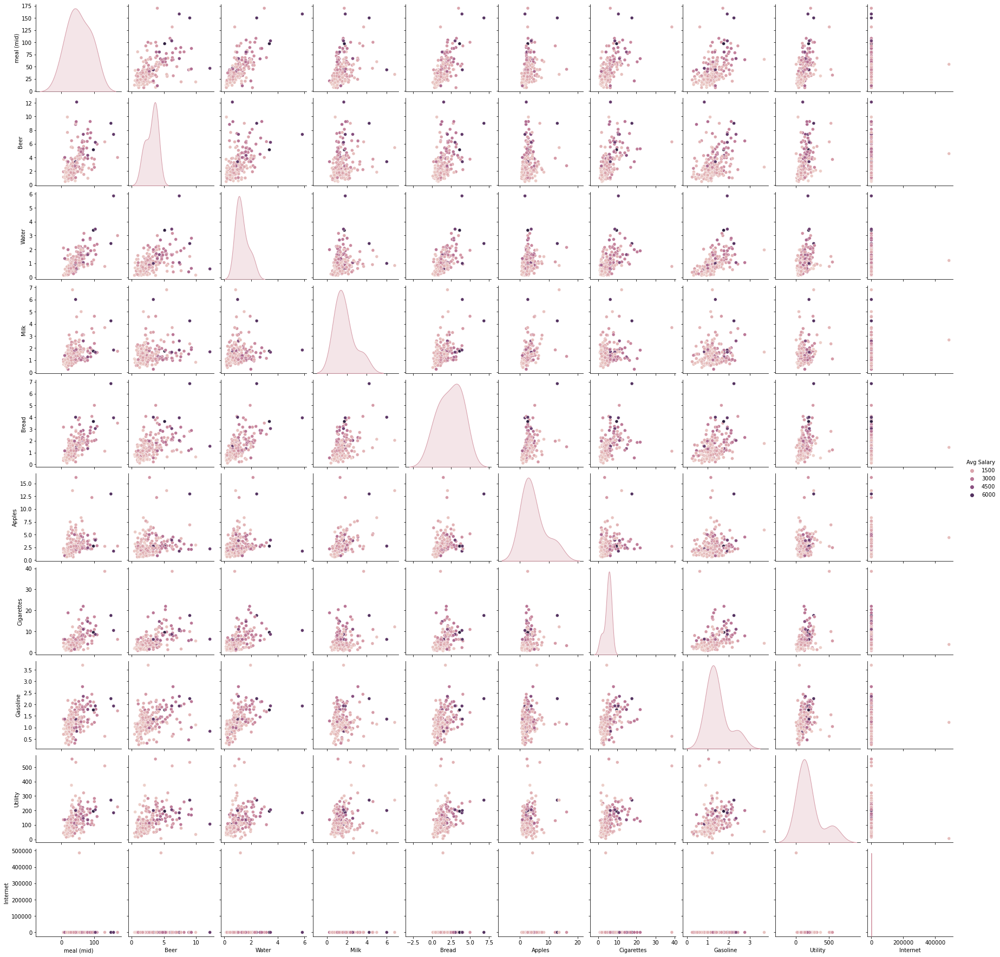

<Figure size 1008x1008 with 0 Axes>

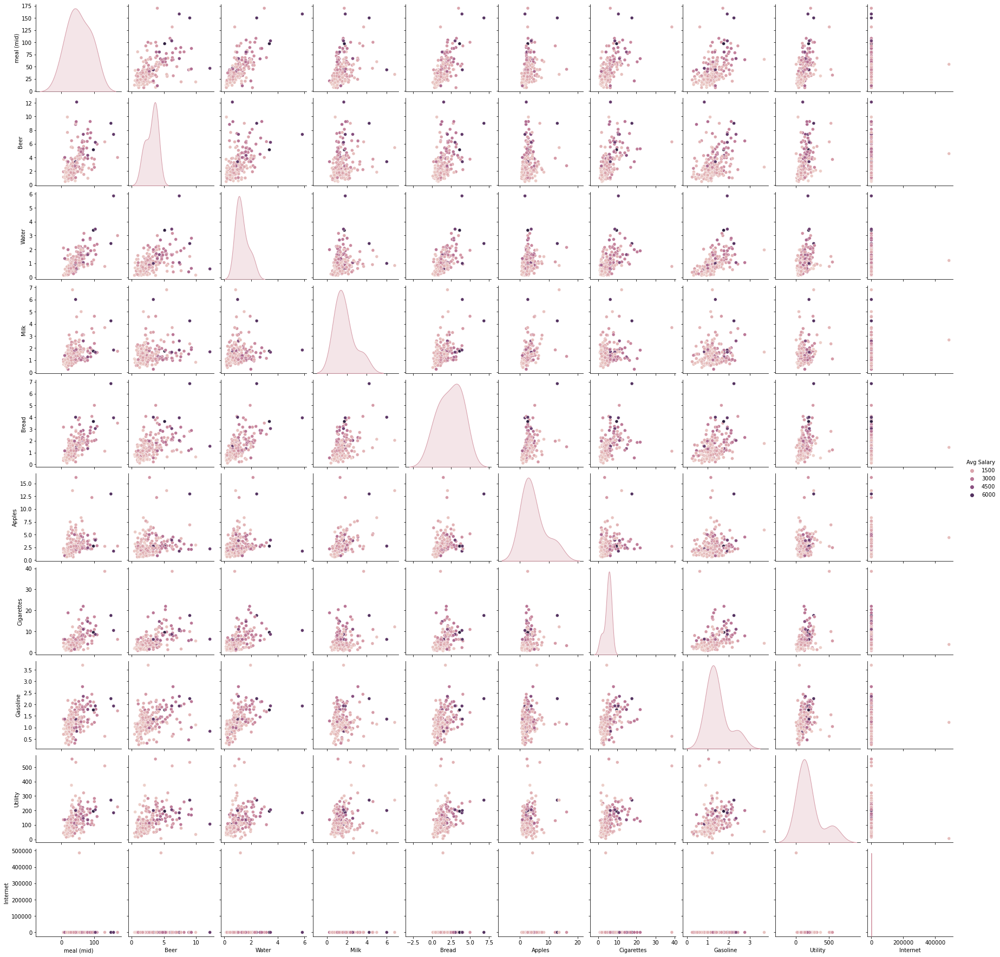

<Figure size 1008x1008 with 0 Axes>

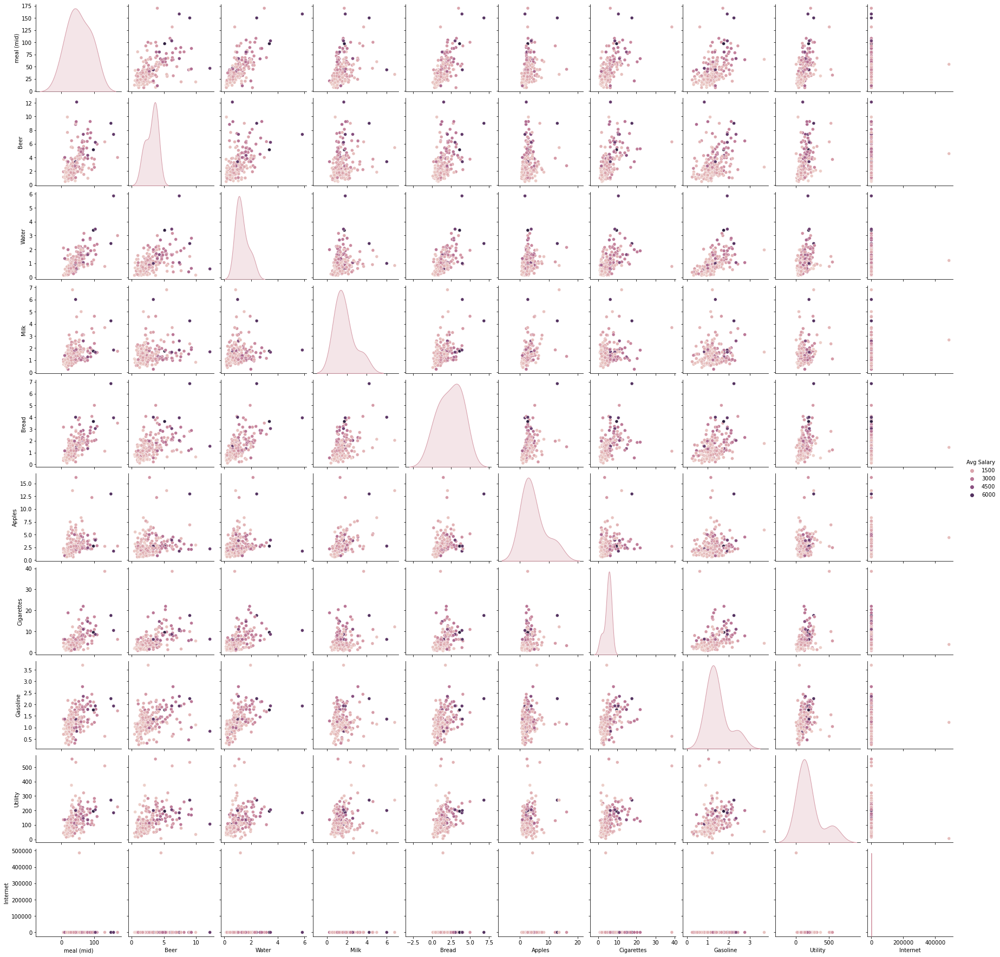

<Figure size 1008x1008 with 0 Axes>

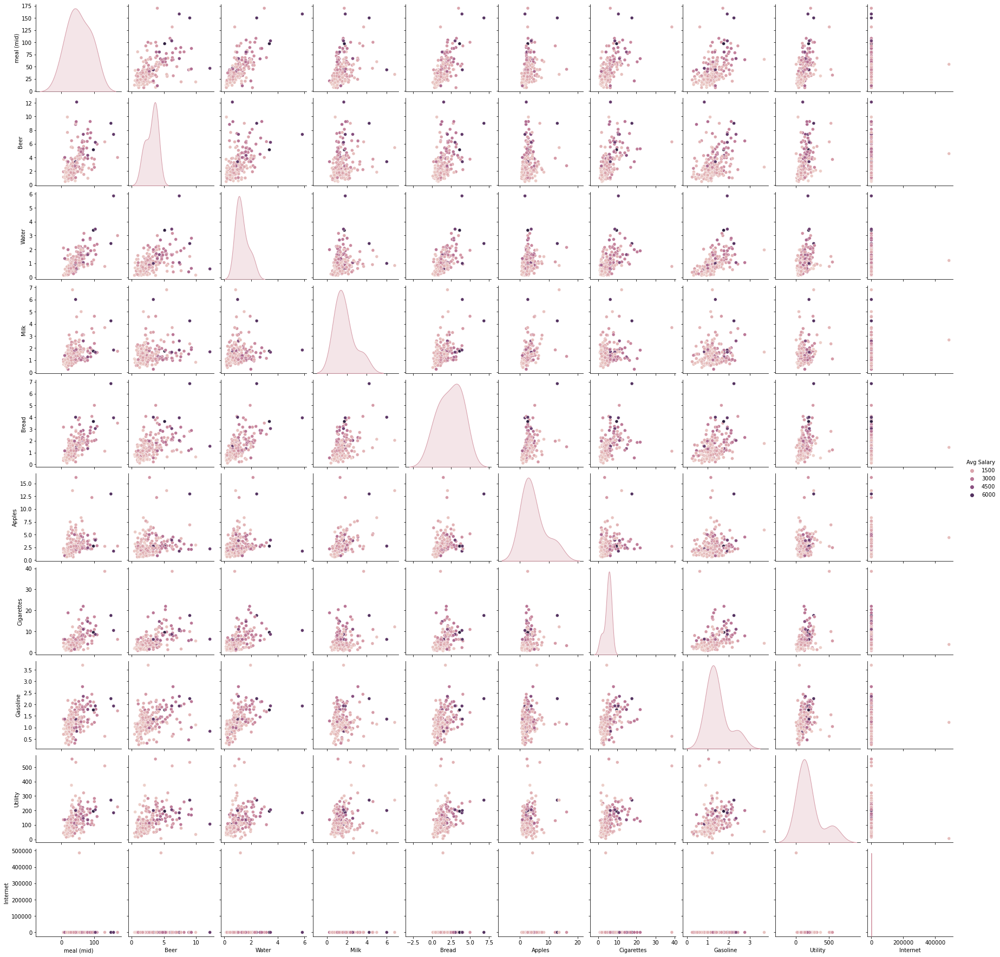

<Figure size 1008x1008 with 0 Axes>

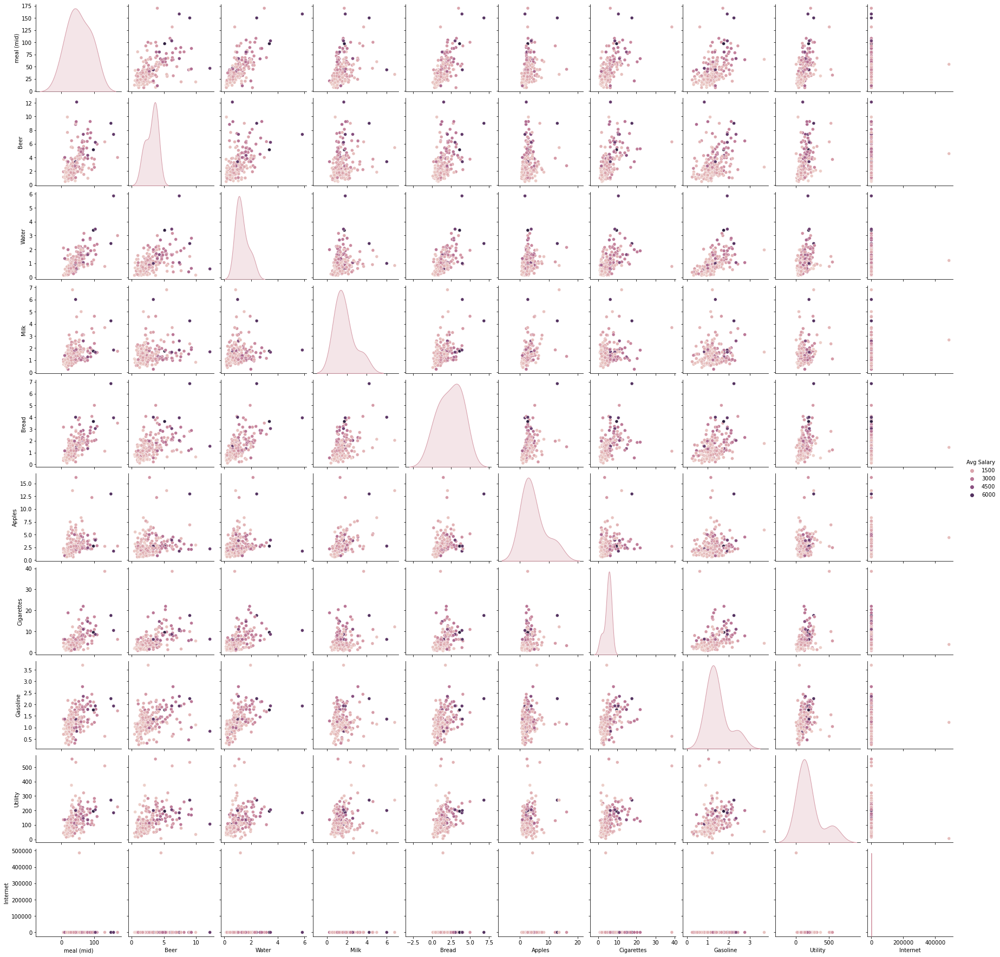

<Figure size 1008x1008 with 0 Axes>

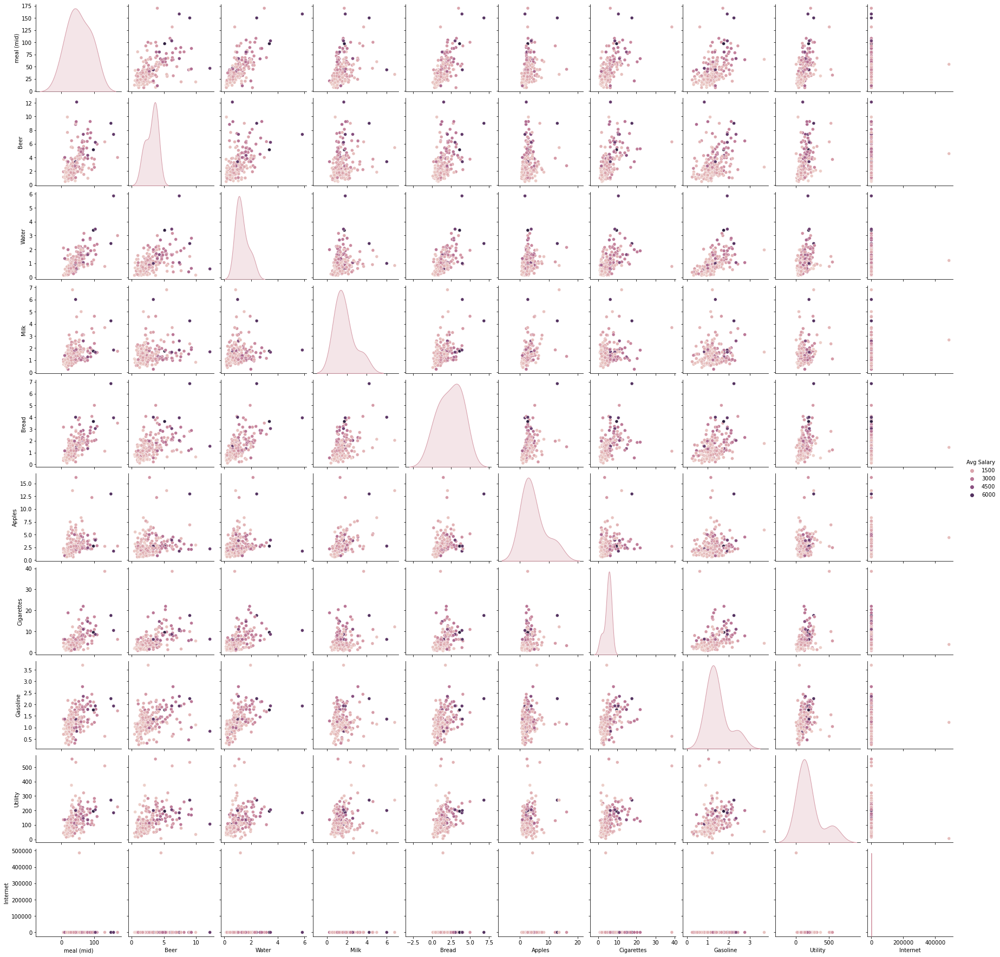

<Figure size 1008x1008 with 0 Axes>

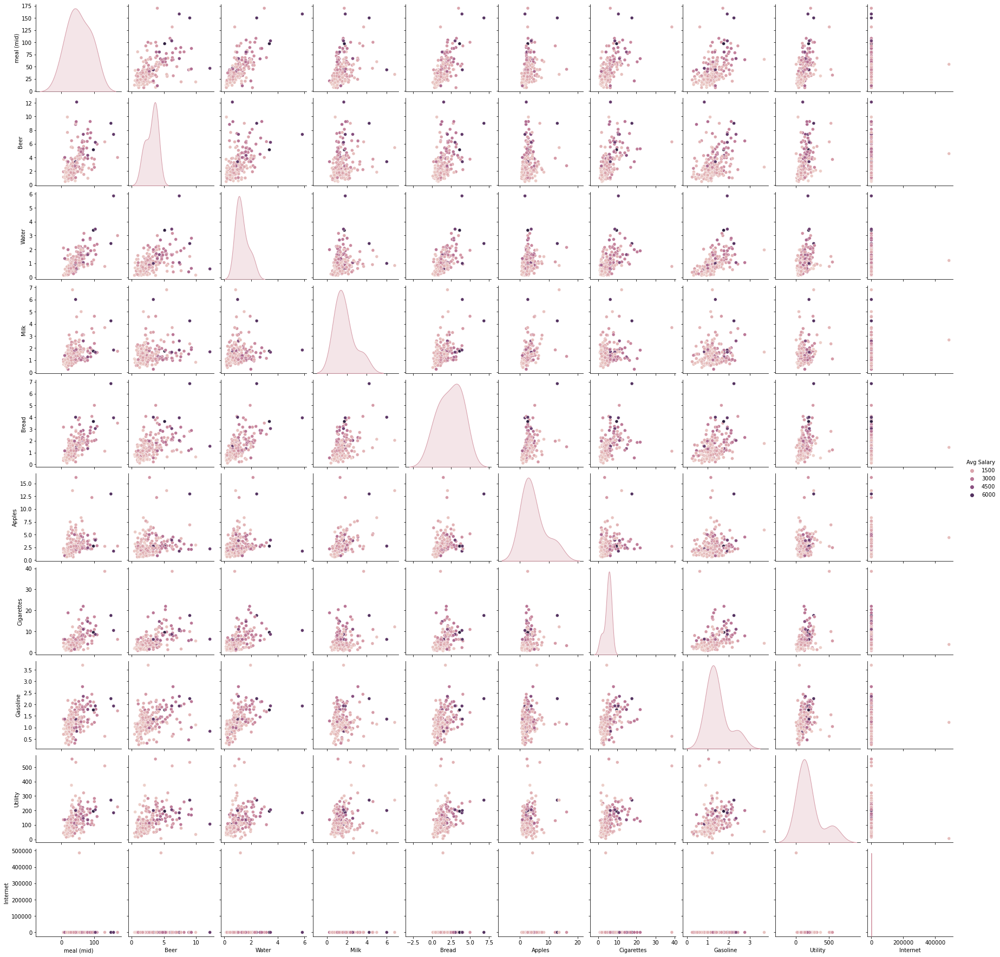

/Users/kashishgupta/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_continuous_distns.py:4837: IntegrationWarning: The algorithm does not converge.  Roundoff error is detected
  in the extrapolation table.  It is assumed that the requested tolerance
  cannot be achieved, and that the returned result (if full_output = 1) is 
  the best which can be obtained.
  intg = integrate.quad(f, -xi, np.pi/2, **intg_kwargs)[0]


<Figure size 1008x1008 with 0 Axes>

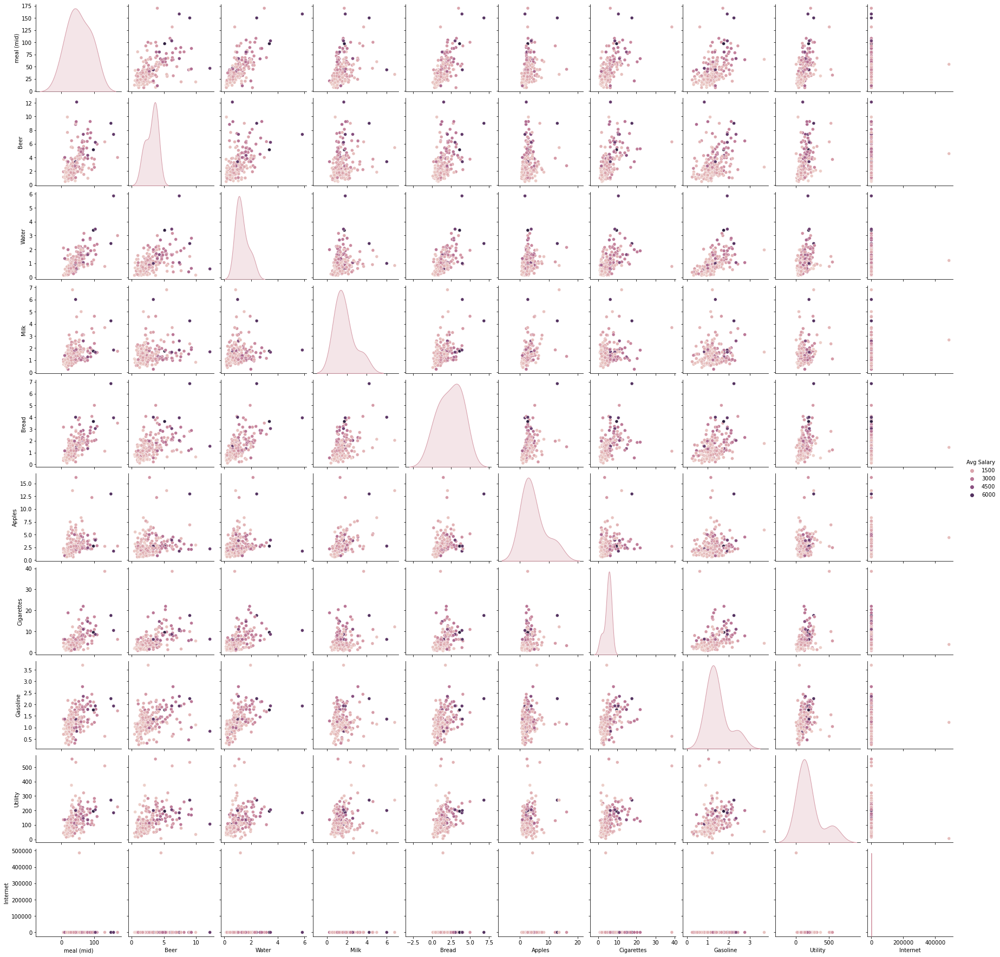

In [64]:
# pairwaise correlation 

for i in cost_new.columns[2:]: 
    plt.figure(figsize=(14,14))
    sns.pairplot(cost_new, hue="Avg Salary", vars=['meal (mid)', 'Beer', 'Water', 'Milk', 'Bread', 'Apples', 'Cigarettes', 'Gasoline', 'Utility', 'Internet'])
    plt.show()
    
# observation: variables exhibit non-linearities and need to be transformed using quadratic, log transformation

<AxesSubplot:title={'center':'Correlation Heatmap'}>

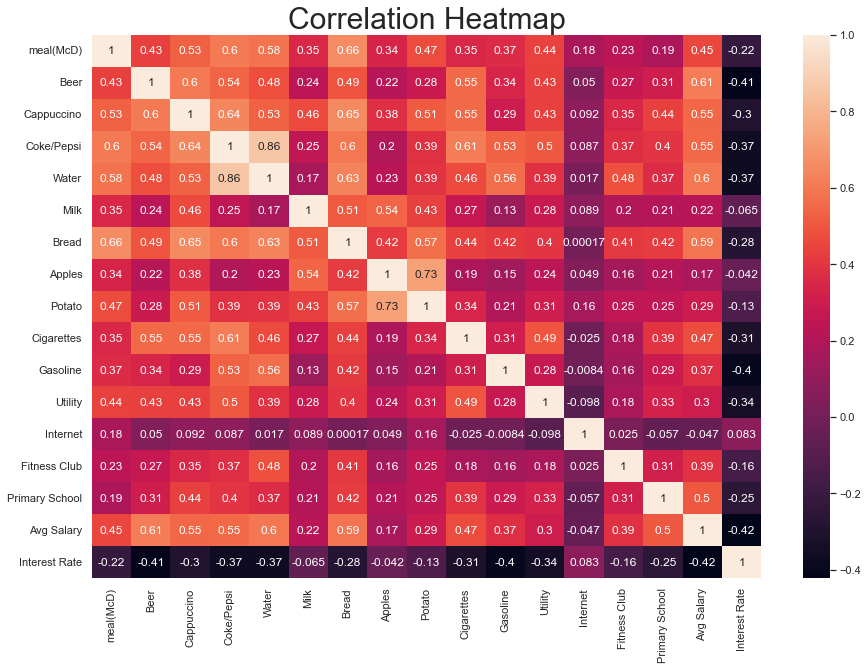

In [65]:
# correlation heatmap 

sns.set(rc={'figure.figsize':(15,10)})
plt.title("Correlation Heatmap",size=30)
sns.heatmap(cost_new.iloc[:,2:].corr(), annot=True)

# observation: high degree of correlation among variables, need to check for multicollinearity 